# Level 1: Task 3 - Geospatial Analysis

In [1]:
import pandas as pd
import plotly.express as px
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('../task2/cleaned_data.csv')

In [4]:
#Create Map and Enabling Marker Clustering

map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=2)
marker_cluster = MarkerCluster().add_to(restaurant_map)

#Add One Marker Per Restaurant

for _,row in df.iterrows():
    folium.Marker(
        location = [row['Latitude'], row['Longitude']],
        popup = f"({row['Restaurant Name']}), ({row['Aggregate rating']})",
        tooltip = row['City'],
    ).add_to(marker_cluster)

restaurant_map

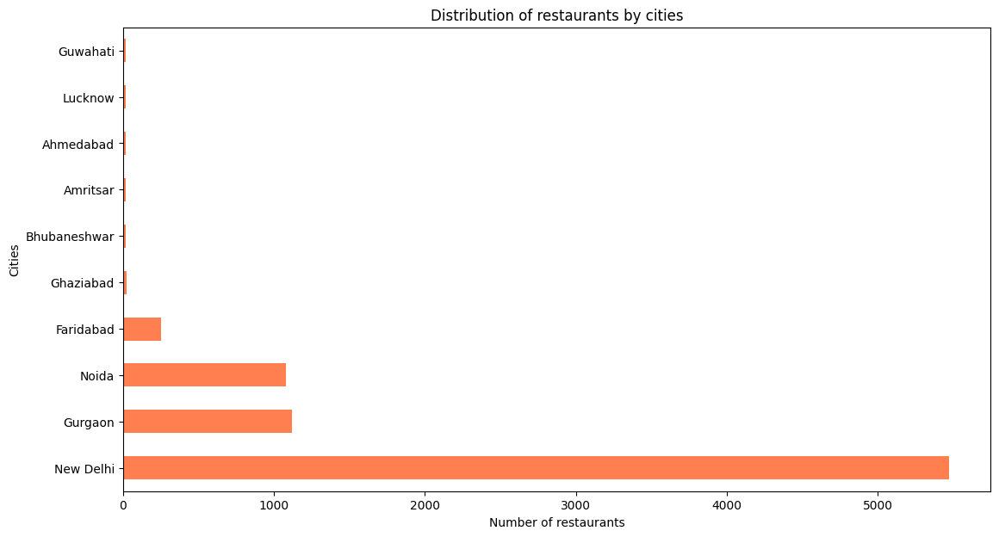

In [5]:
#Distribution of restaurants in different cities

df['City'].value_counts().head(10).plot(kind='barh', figsize=(13, 7), color='coral')
plt.title('Distribution of restaurants by cities')
plt.xlabel('Number of restaurants')
plt.ylabel('Cities')
plt.show()

In [6]:
#Check correlation

correlation = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
print(correlation)

                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


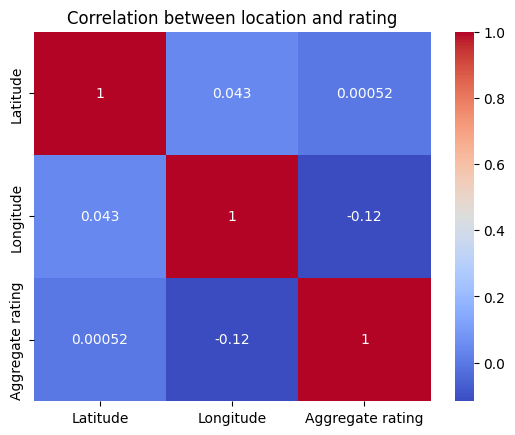

In [7]:
#Correlation heatmap

sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation between location and rating')
plt.show()

### 📌 Correlation Between Location and Rating

There is **no significant correlation** between a restaurant's geographic location (*latitude* or *longitude*) and its **aggregate rating**.

The correlation coefficients are very close to **0**, indicating that a restaurant’s position on the map does **not directly influence** its rating.